
# Ideias

Name: passar a coluna name para M/F. **done**
Birthyear: bins das decadas?/idade?
Education: one hot para a educação/ passar para low, medium high? ? passar minusculas para maiusculas / meter o nan como o valor mais comum? Preencher com k neighbors?
Income: Ver se tem valores estranhos. Min max scaling ?
Kid_younger6: Ver se tem valores estranhos (floats ou negativos ou nan) / preencher nan com 0?
Children_6to18: Ver acima
Response_cmp1-4: ver se nao tem nada estranho
Date adherence: passar data de adesao para o tempo de adesao? datetime- date adherence
Recency: ver se não tem valores estranhos (negativos, floats)
Mnt???: ver acima, computar a soma de todos?
Num???Purchases: ver acima
NumAppVisits: ver se nao tem valores estranhos
Complain: ver acima




In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import numpy as np
from sklearn import metrics as skm
from sklearn.preprocessing import LabelBinarizer
from category_encoders.count import CountEncoder
#from ydata_profiling import ProfileReport

In [74]:
def model_metrics(y_true, y_pred, name, y_prob= (), prints= False, accuracy= False,
                  precision= False, f1= False, hamming_loss= False,
                  cohen_kappa= False, matthews_corr= False):
    '''Description: This function calculates the evaluation metrics of a machine learning model given the true labels (y_true) and predicted labels (y_pred). The function allows the user to specify which evaluation metrics to calculate and whether to print the results or not. The function returns a list of evaluation metrics, including accuracy, precision, F1 score, Hamming loss, Cohen's kappa score, Matthews correlation coefficient, and the name of the model.

    Parameters:
        y_true: array-like, true labels of the data;
        y_pred: array-like, predicted labels of the data;
        name: str, name of the machine learning model;
        y_prob: array-like, optional, default (), predicted probabilities of the data (only required for some evaluation metrics)
        prints: bool, optional, default False, whether to print the evaluation metrics or not
        accuracy: bool, optional, default False, whether to calculate accuracy or not
        precision: bool, optional, default False, whether to calculate precision or not
        f1: bool, optional, default False, whether to calculate F1 score or not
        hamming_loss: bool, optional, default False, whether to calculate Hamming loss or not
        cohen_kappa: bool, optional, default False, whether to calculate Cohen's kappa score or not
        matthews_corr: bool, optional, default False, whether to calculate Matthews correlation coefficient or not
    Returns: a list of evaluation metrics including accuracy, precision, F1 score, Hamming loss, Cohen's kappa score, Matthews correlation coefficient, and the name of the model.
    '''
    if accuracy:
        acc= skm.accuracy_score(y_true, y_pred)
    else:
        acc= 0
    if precision:
        prec= skm.precision_score(y_true, y_pred, average= 'weighted')
    else:
        prec= 0
    if f1:
        f1score= skm.f1_score(y_true, y_pred, average= 'weighted')
    else:
        f1score= 0
    if hamming_loss:
        h_loss= skm.hamming_loss(y_true, y_pred)
    else:
        h_loss= 0
    if cohen_kappa:
        ckappa= skm.cohen_kappa_score(y_true, y_pred)
    else:
        ckappa= 0
    if matthews_corr:
        mcc= skm.matthews_corrcoef(y_true, y_pred)
    else:
        mcc= 0
    if prints:
        if accuracy:
            print('The accuracy score is:', acc)
        if precision:
            print('The precision score is:', prec)
        if f1:
            print('The F1 score is:', f1score)
        if hamming_loss:
            print('The Hamming loss is:', h_loss)
        if cohen_kappa:
            print('Cohens kappa score is:', ckappa)
        if matthews_corr:
            print('Matthews Correlation Coefficient:', mcc)
    return [acc, prec, f1score, h_loss, ckappa, mcc, name]

In [75]:
def var_plot(x, y, n_fig, plot_type):
    pass


In [76]:
crm_df= pd.read_csv(r'crm.csv').sort_values(['CustomerID']).set_index(['CustomerID'])
mkt_df= pd.read_csv(r'mkt.csv').sort_values(['CustomerID']).set_index(['CustomerID'])
sales_df= pd.read_excel(r'sales.xlsx').sort_values(['CustomerID']).set_index(['CustomerID'])

In [77]:
df_join= crm_df.join(mkt_df)
df_join= df_join.join(sales_df)
df_join.head()

,Name,Birthyear,Education,Marital_Status,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,...,MntVegan&Vegetarian,MntDrinks,MntDesserts,MntAdditionalRequests,NumOfferPurchases,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain
CustomerID,,,,,,,,,,,,,,,,,,,,,
5078,Mr. Isaac Arnold,1969,Graduation,Together,99861.0,0,0,0,1,0,...,9240.0,2800.0,840.0,28.0,1,8,6,10,4,0
5081,Mr. Austin Abraham,1964,PhD,Divorced,124326.0,0,0,0,0,0,...,8760.0,1220.0,600.0,30.0,1,5,3,8,1,0
5084,Mrs. Bernadette Allan,1979,Master,Divorced,31179.0,1,0,1,0,0,...,150.0,0.0,200.0,27.0,3,4,3,2,7,0
5087,Mrs. Kylie Russell,1969,PhD,Divorced,102929.0,0,1,0,0,0,...,2520.0,1060.0,880.0,133.0,3,9,4,13,5,0
5090,Mr. Julian Arnold,1975,Master,Married,101038.0,0,1,0,0,0,...,4770.0,900.0,900.0,216.0,1,11,8,11,6,0


In [78]:
df_join = df_join[~df_join.duplicated()] # drop duplicates rows

In [79]:
#profile = ProfileReport(df_join, title="Profiling Report")

In [80]:
#profile.to_file("dsml.html")

## Tratamento de dados

### Name
Passar o titulo para a variavel binaria 'Sex' Female: 0, Male: 1 **Done**
Ver se tem valores que não façam sentido

In [81]:
rege= '^(Mrs\.|Miss)\s.+'
df_join['Gender'] = np.where(df_join.Name.str.match(rege), '0', '1') #Female= 0, Male= 1

In [82]:
df_join.Gender.head()

CustomerID
5078    1
5081    1
5084    0
5087    0
5090    1
Name: Gender, dtype: object

### Birthyear
Ver se há nans **done**
Converter para idade **done**

In [83]:
df_join.Birthyear.isna().sum()

0

In [84]:
from datetime import date
df_join['Age']= df_join.Birthyear.apply(lambda x: date.today().year-x)
df_join.drop('Birthyear', axis= 1, inplace= True)

In [85]:
df_join.Age.head()

CustomerID
5078    54
5081    59
5084    44
5087    54
5090    48
Name: Age, dtype: int64

### Education
Ver se tem valores não desejáveis **done**
Corrigir/Merge as rows com variações **done**
Preencher os Nan com a moda (?) **done**
Converter com count encoding (?) (A frequencia das classes é bastante diferente por isso nao faz sentido usar ordinal scaling)

In [86]:
df_join['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'HighSchool', 'Basic', 'graduation',
       'master', nan, 'highschool', 'phd'], dtype=object)

In [87]:
edu_dict= {'graduation': 'Graduation', 'master': 'Master', 'phd': 'PhD', 'highschool': 'HighSchool'}
df_join.replace({'Education': edu_dict}, inplace= True)

In [88]:
df_join['Education'].fillna(df_join['Education'].mode()[0], inplace =True)

In [89]:
df_join['Education'].unique()

array(['Graduation', 'PhD', 'Master', 'HighSchool', 'Basic'], dtype=object)

In [90]:
#df_join['Edu Count']= sk.ca

## Marital Status
Converter minusculas para maiusculas **done**
One Hot (?) **done**

In [91]:
df_join['Marital_Status'].unique()

array(['Together', 'Divorced', 'Married', 'Single', 'together', 'Widow',
       'divorced', 'married', 'single', 'widow'], dtype=object)

In [92]:
marital_dict= {'together': 'Married', 'divorced': 'Divorced', 'married': 'Married', 'single': 'Single', 'widow': 'Widow','Together': 'Married'}
df_join.replace({'Marital_Status': marital_dict}, inplace= True)

In [93]:
df_join['Marital_Status'].unique()

array(['Married', 'Divorced', 'Single', 'Widow'], dtype=object)

In [94]:
marital_status_df= pd.get_dummies(df_join.Marital_Status)
df_join= df_join.join(pd.DataFrame(marital_status_df)).drop('Marital_Status', axis= 1)

In [95]:
df_join.head()

,Name,Education,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,...,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Gender,Age,Divorced,Married,Single,Widow
CustomerID,,,,,,,,,,,,,,,,,,,,,
5078,Mr. Isaac Arnold,Graduation,99861.0,0,0,0,1,0,0,0,...,6,10,4,0,1,54,0,1,0,0
5081,Mr. Austin Abraham,PhD,124326.0,0,0,0,0,0,0,0,...,3,8,1,0,1,59,1,0,0,0
5084,Mrs. Bernadette Allan,Master,31179.0,1,0,1,0,0,0,0,...,3,2,7,0,0,44,1,0,0,0
5087,Mrs. Kylie Russell,PhD,102929.0,0,1,0,0,0,0,0,...,4,13,5,0,0,54,1,0,0,0
5090,Mr. Julian Arnold,Master,101038.0,0,1,0,0,0,1,0,...,8,11,6,0,1,48,0,1,0,0


## Kid_younger6
Ver se tem valores estranhos (floats ou negativos ou nan) **done** <br>
Preencher nan com 0? **N/A** <br>

In [96]:

kid_younger6_column = df_join['Kid_Younger6']
kid_younger6_lt_zero = df_join[kid_younger6_column< 0]
kid_younger6_is_nan = kid_younger6_column.isna().any()
kid_younger6_is_float = kid_younger6_column.dtype == float

print(kid_younger6_lt_zero) #false
print(kid_younger6_is_nan) #false
print(kid_younger6_is_float) #false

Empty DataFrame
Columns: [Name, Education, Income, Kid_Younger6, Children_6to18, Response_Cmp1, Response_Cmp2, Response_Cmp3, Response_Cmp4, Response_Cmp5, Date_Adherence, Recency, MntMeat&Fish, MntEntries, MntVegan&Vegetarian, MntDrinks, MntDesserts, MntAdditionalRequests, NumOfferPurchases, NumAppPurchases, NumTakeAwayPurchases, NumStorePurchases, NumAppVisitsMonth, Complain, Gender, Age, Divorced, Married, Single, Widow]
Index: []

[0 rows x 30 columns]
False
False


## Children_6to18
Ver se tem valores estranhos (floats ou negativos ou nan) **done** <br>
Preencher nan com 0? **N/A** <br>

In [97]:
children_6to18_column = df_join['Children_6to18']
children_6to18_lt_zero = df_join[children_6to18_column< 0]
children_6to18_is_nan = children_6to18_column.isna().any()
children_6to18_is_float = children_6to18_column.dtype == float

print(children_6to18_lt_zero) #false
print(children_6to18_is_nan) #false
print(children_6to18_is_float) #false

Empty DataFrame
Columns: [Name, Education, Income, Kid_Younger6, Children_6to18, Response_Cmp1, Response_Cmp2, Response_Cmp3, Response_Cmp4, Response_Cmp5, Date_Adherence, Recency, MntMeat&Fish, MntEntries, MntVegan&Vegetarian, MntDrinks, MntDesserts, MntAdditionalRequests, NumOfferPurchases, NumAppPurchases, NumTakeAwayPurchases, NumStorePurchases, NumAppVisitsMonth, Complain, Gender, Age, Divorced, Married, Single, Widow]
Index: []

[0 rows x 30 columns]
False
False


## Dinheiro Gasto

In [98]:
df_join

,Name,Education,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,...,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Gender,Age,Divorced,Married,Single,Widow
CustomerID,,,,,,,,,,,,,,,,,,,,,
5078,Mr. Isaac Arnold,Graduation,99861.0,0,0,0,1,0,0,0,...,6,10,4,0,1,54,0,1,0,0
5081,Mr. Austin Abraham,PhD,124326.0,0,0,0,0,0,0,0,...,3,8,1,0,1,59,1,0,0,0
5084,Mrs. Bernadette Allan,Master,31179.0,1,0,1,0,0,0,0,...,3,2,7,0,0,44,1,0,0,0
5087,Mrs. Kylie Russell,PhD,102929.0,0,1,0,0,0,0,0,...,4,13,5,0,0,54,1,0,0,0
5090,Mr. Julian Arnold,Master,101038.0,0,1,0,0,0,1,0,...,8,11,6,0,1,48,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35057,Mr. Jacob Grant,HighSchool,103804.0,0,1,0,0,0,0,0,...,3,9,7,0,1,63,0,1,0,0
35063,Mr. Thomas Parr,Graduation,59722.0,0,0,0,0,0,1,0,...,4,5,6,0,1,42,0,1,0,0
35066,Mr. Trevor Dickens,Graduation,138559.0,0,1,0,1,1,0,0,...,6,5,5,0,1,58,0,1,0,0


In [99]:
(df_join['Income']<0).sum() # Sem valores negativos em income
(df_join['NumAppPurchases']<0).sum() # Sem valores negativos em app purchases
(df_join['NumAppVisitsMonth']<0).sum() # Sem valores negativos em appvisits
(df_join['NumStorePurchases']<0).sum() # Sem valores negativos em storepurchases
(df_join['NumTakeAwayPurchases']<0).sum() # Sem valores negativos em takeawaypurchases

0

In [100]:
df_join.describe()

,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,Recency,MntMeat&Fish,...,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Age,Divorced,Married,Single,Widow
count,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,6977.000000,7000.000000,...,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000
mean,77988.962407,0.440571,0.490571,0.079143,0.073286,0.083000,0.065857,0.014286,49.235058,3079.523800,...,6.015714,3.834571,5.790571,5.278286,0.010286,46.548571,0.092143,0.653143,0.219714,0.035000
std,35409.810253,0.543477,0.542174,0.269981,0.260624,0.275902,0.248050,0.118675,28.922688,3370.377166,...,2.745537,3.331142,3.295708,2.748596,0.100903,11.996270,0.289248,0.476004,0.414083,0.183793
min,2493.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000,0.000000,0.000000
25%,51586.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,24.000000,250.000000,...,4.000000,1.000000,3.000000,3.000000,0.000000,38.000000,0.000000,0.000000,0.000000,0.000000
50%,77190.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,49.000000,1820.000000,...,6.000000,3.000000,5.000000,5.000000,0.000000,46.000000,0.000000,1.000000,0.000000,0.000000
75%,102016.250000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,74.000000,5070.000000,...,8.000000,5.000000,8.000000,7.000000,0.000000,56.000000,0.000000,1.000000,0.000000,0.000000
max,237639.725000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,99.000000,14980.000000,...,13.000000,24.000000,13.000000,20.000000,1.000000,75.000000,1.000000,1.000000,1.000000,1.000000


In [101]:
df_join.quantile(q=[0.25, 0.5, 0.75], axis=0, numeric_only=True)

,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,Recency,MntMeat&Fish,...,NumAppPurchases,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Age,Divorced,Married,Single,Widow
0.25,51586.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,250.0,...,4.0,1.0,3.0,3.0,0.0,38.0,0.0,0.0,0.0,0.0
0.50,77190.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49.0,1820.0,...,6.0,3.0,5.0,5.0,0.0,46.0,0.0,1.0,0.0,0.0
0.75,102016.25,1.0,1.0,0.0,0.0,0.0,0.0,0.0,74.0,5070.0,...,8.0,5.0,8.0,7.0,0.0,56.0,0.0,1.0,0.0,0.0


In [102]:
df_join.Recency.isna().sum() #23
df_join.MntDrinks.isna().sum() #28 missing values

28

In [103]:
recencynulldf = df_join[df_join['Recency'].isnull()]
recencynulldf

,Name,Education,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,...,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Gender,Age,Divorced,Married,Single,Widow
CustomerID,,,,,,,,,,,,,,,,,,,,,
6092,Mr. Thomas Piper,Graduation,33013.0,0,0,0,0,0,0,0,...,1,4,9,0,1,59,0,1,0,0
7283,Mr. Benjamin Walsh,HighSchool,60285.0,0,1,0,0,0,0,0,...,2,5,4,0,1,47,0,1,0,0
8354,Mr. Isaac Scott,PhD,42140.0,1,0,0,0,0,0,0,...,1,2,8,0,1,34,0,1,0,0
9173,Mr. Stewart Walsh,Graduation,28434.0,1,0,0,0,0,0,0,...,1,3,8,0,1,35,0,0,0,1
9770,Mr. Oliver Bailey,PhD,58791.0,1,1,0,0,0,0,0,...,1,4,8,0,1,51,0,1,0,0
12353,Mr. Adrian Clark,HighSchool,98338.0,0,1,0,0,0,0,0,...,10,4,4,0,1,44,0,1,0,0
13955,Mr. Paul Chapman,Graduation,89496.0,0,1,0,0,0,0,0,...,3,10,4,0,1,41,0,1,0,0
18368,Mr. Julian Jones,PhD,104790.0,0,0,0,0,0,0,0,...,4,6,1,0,1,38,0,0,1,0
18731,Mr. Warren Lawrence,PhD,42343.0,1,0,0,0,0,0,0,...,7,4,9,0,1,34,0,1,0,0


In [104]:
MntDrinksnulldf = df_join[df_join['MntDrinks'].isnull()]
MntDrinksnulldf

,Name,Education,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,...,NumTakeAwayPurchases,NumStorePurchases,NumAppVisitsMonth,Complain,Gender,Age,Divorced,Married,Single,Widow
CustomerID,,,,,,,,,,,,,,,,,,,,,
5117,Mr. Trevor Davies,Master,63797.0,1,1,0,0,0,0,0,...,2,3,5,0,1,65,0,1,0,0
5444,Mr. Michael James,Graduation,81638.0,0,1,0,0,0,0,0,...,7,6,6,0,1,63,1,0,0,0
10031,Mr. John Sanderson,PhD,110126.0,0,0,0,0,0,0,0,...,4,4,4,0,1,27,0,1,0,0
10142,Miss Leah Johnston,Master,41267.0,1,0,0,0,0,0,0,...,1,4,8,0,0,36,0,0,1,0
10736,Mr. Joe Dowd,HighSchool,99700.0,0,1,0,0,0,0,0,...,5,12,5,0,1,62,0,0,1,0
12368,Miss Joan May,PhD,93871.0,0,1,0,1,0,0,0,...,5,6,3,0,0,65,0,1,0,0
12989,Mr. Connor Alsop,Graduation,97951.0,0,0,0,0,0,0,0,...,4,7,5,0,1,52,0,1,0,0
14468,Mr. Joe Paterson,HighSchool,120649.0,0,0,0,0,1,1,0,...,7,5,1,0,1,44,0,1,0,0
14663,Mr. Jason Underwood,HighSchool,85875.0,0,1,0,0,0,0,0,...,4,8,4,0,1,37,0,1,0,0


In [105]:
df_join['Recency'].fillna(df_join['Recency'].mode()[0], inplace =True) # nulls pela moda
df_join['MntDrinks'].fillna(df_join['MntDrinks'].mode()[0], inplace =True) #nulls pela moda

In [106]:
df_join['Recency'].isna().sum() #0
df_join['MntDrinks'].isna().sum() #0

0

In [107]:
df = df_join.copy()
df['MntTotal'] = df['MntAdditionalRequests'] + df['MntDesserts'] + df['MntDrinks'] + df['MntVegan&Vegetarian'] + df['MntEntries'] + df['MntMeat&Fish']
df

,Name,Education,Income,Kid_Younger6,Children_6to18,Response_Cmp1,Response_Cmp2,Response_Cmp3,Response_Cmp4,Response_Cmp5,...,NumStorePurchases,NumAppVisitsMonth,Complain,Gender,Age,Divorced,Married,Single,Widow,MntTotal
CustomerID,,,,,,,,,,,,,,,,,,,,,
5078,Mr. Isaac Arnold,Graduation,99861.0,0,0,0,1,0,0,0,...,10,4,0,1,54,0,1,0,0,19488.0
5081,Mr. Austin Abraham,PhD,124326.0,0,0,0,0,0,0,0,...,8,1,0,1,59,1,0,0,0,19360.0
5084,Mrs. Bernadette Allan,Master,31179.0,1,0,1,0,0,0,0,...,2,7,0,0,44,1,0,0,0,677.0
5087,Mrs. Kylie Russell,PhD,102929.0,0,1,0,0,0,0,0,...,13,5,0,0,54,1,0,0,0,11673.0
5090,Mr. Julian Arnold,Master,101038.0,0,1,0,0,0,1,0,...,11,6,0,1,48,0,1,0,0,14616.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35057,Mr. Jacob Grant,HighSchool,103804.0,0,1,0,0,0,0,0,...,9,7,0,1,63,0,1,0,0,11044.0
35063,Mr. Thomas Parr,Graduation,59722.0,0,0,0,0,0,1,0,...,5,6,0,1,42,0,1,0,0,14268.0
35066,Mr. Trevor Dickens,Graduation,138559.0,0,1,0,1,1,0,0,...,5,5,0,1,58,0,1,0,0,20761.0


<AxesSubplot:xlabel='MntAdditionalRequests'>

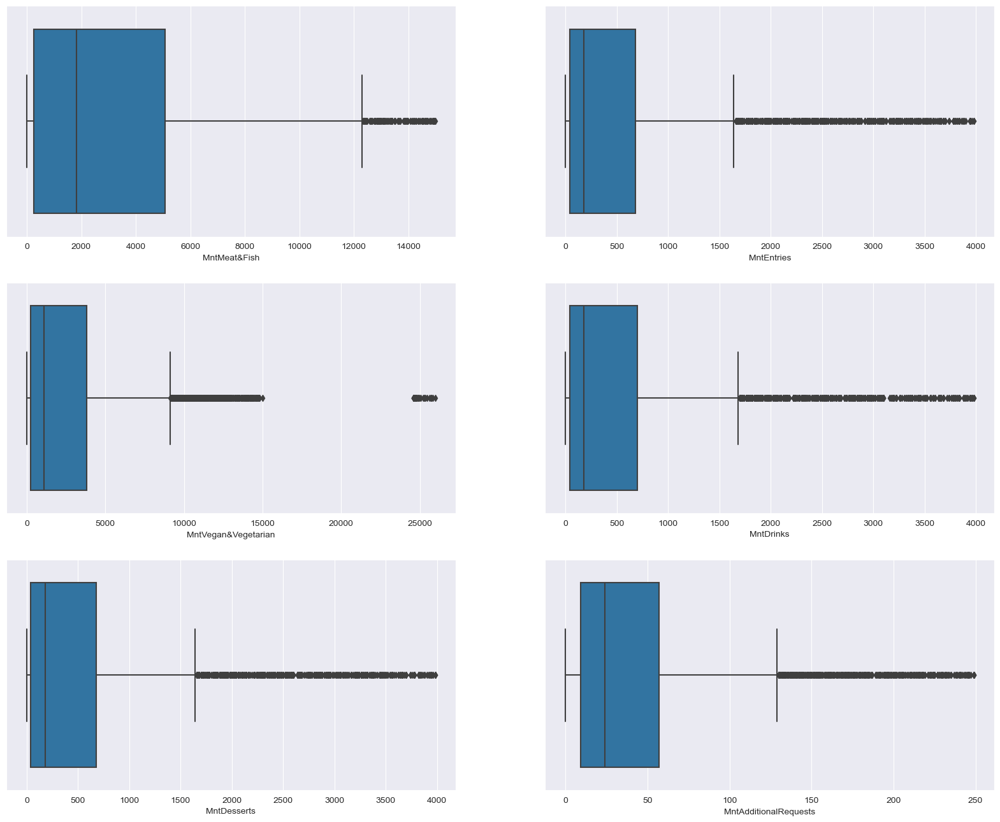

In [108]:
fig, ((ax1, ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.boxplot(ax = ax1, x=df['MntMeat&Fish'])
sns.boxplot(ax = ax2, x=df['MntEntries'])
sns.boxplot(ax = ax3, x=df['MntVegan&Vegetarian'])
sns.boxplot(ax = ax4, x=df['MntDrinks'])
sns.boxplot(ax = ax5, x=df['MntDesserts'])
sns.boxplot(ax = ax6, x=df['MntAdditionalRequests'])


<AxesSubplot:xlabel='MntTotal', ylabel='MntAdditionalRequests'>

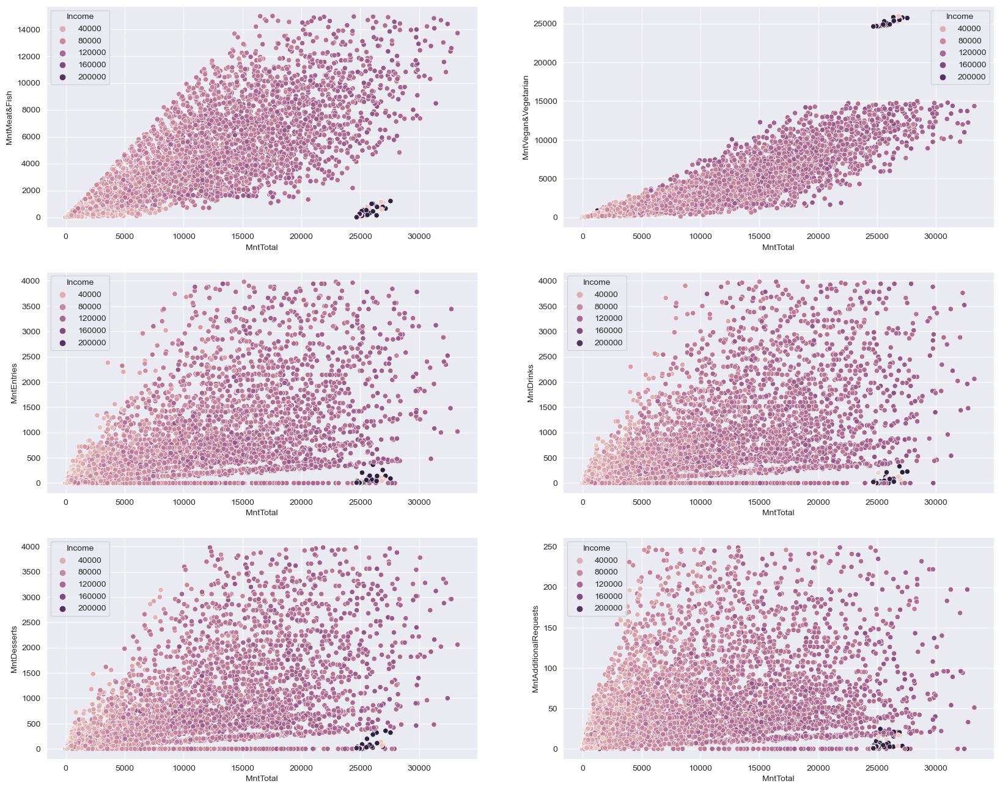

In [109]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "MntMeat&Fish", hue = "Income")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "MntVegan&Vegetarian", hue = "Income")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "MntEntries", hue = "Income")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "MntDrinks", hue = "Income")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "MntDesserts", hue = "Income")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "MntAdditionalRequests", hue = "Income")

Looking at Scatterplot nº2 - Data suggests a positive correlation between the total amount spent and veg & meat/fish. As well as a well defined cluster of extremely high spending vegans

<AxesSubplot:xlabel='MntTotal', ylabel='Complain'>

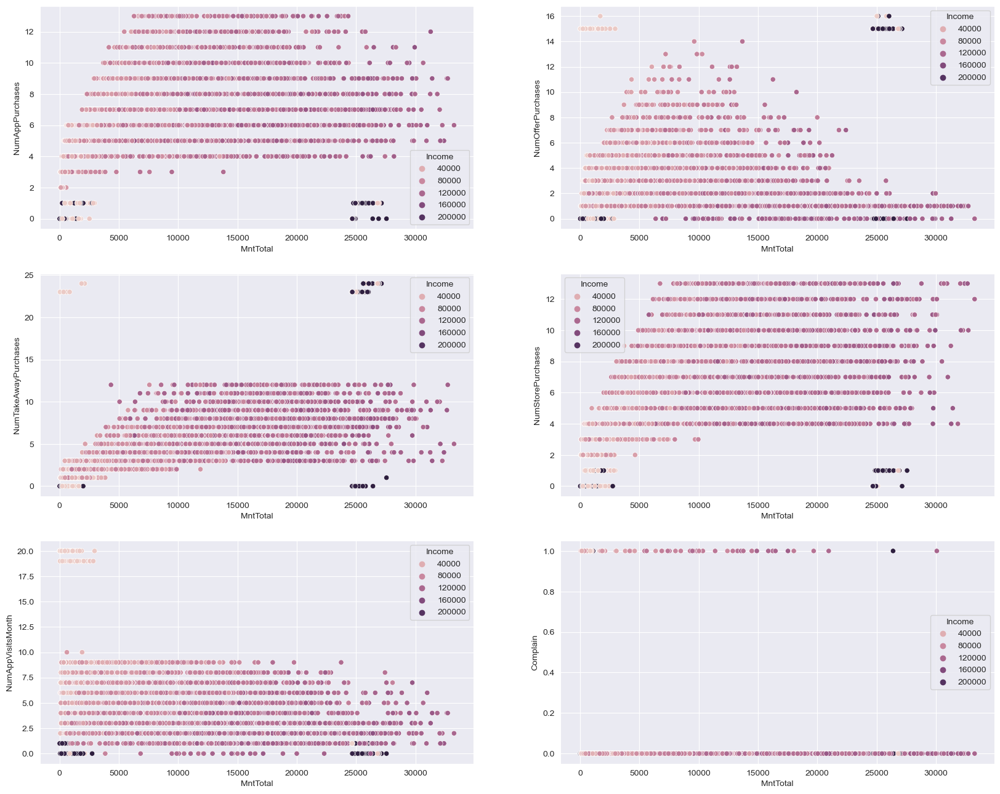

In [110]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "NumAppPurchases", hue = "Income")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "NumOfferPurchases", hue = "Income")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "NumTakeAwayPurchases", hue = "Income")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "NumStorePurchases", hue = "Income")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "NumAppVisitsMonth", hue = "Income")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "Complain", hue = "Income")

Looking at Scatterplot nº2 and nº3  - Data suggests a defined cluster of high spending/high income/take away/offer users as well as a group of low income users w/ same characteristics

<AxesSubplot:xlabel='MntTotal', ylabel='Income'>

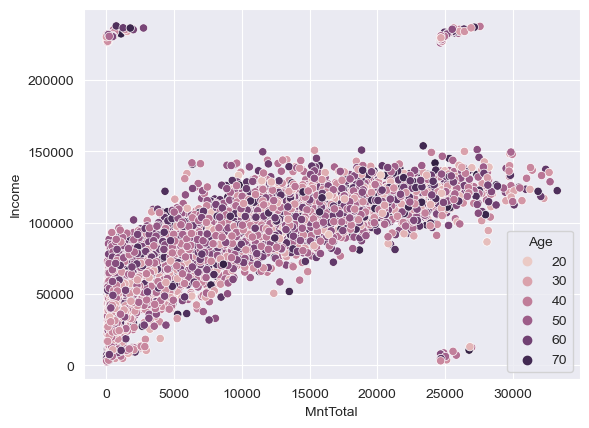

In [111]:
sns.scatterplot( data = df, x = "MntTotal", y = "Income", hue='Age')

It seems there is a positive correlation between total amount spent and income w/ existence of outliers. No trend related to age

<AxesSubplot:xlabel='MntTotal', ylabel='MntAdditionalRequests'>

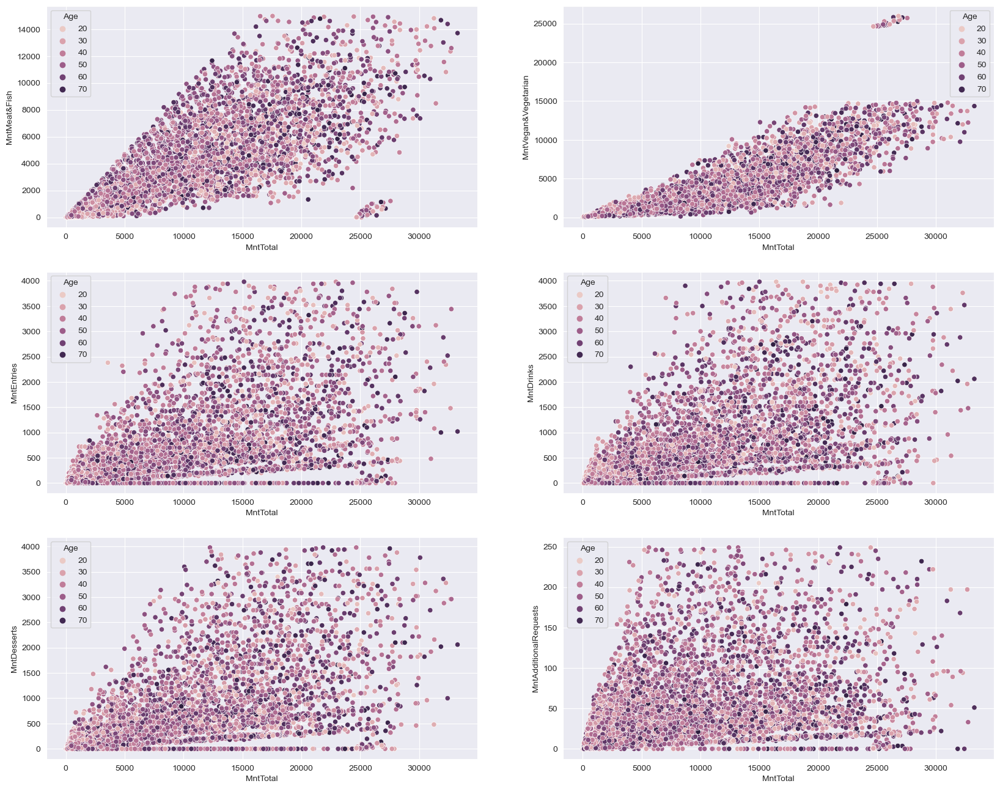

In [112]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "MntMeat&Fish", hue = "Age")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "MntVegan&Vegetarian", hue = "Age")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "MntEntries", hue = "Age")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "MntDrinks", hue = "Age")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "MntDesserts", hue = "Age")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "MntAdditionalRequests", hue = "Age")

Can't detect a trend relating to age

<AxesSubplot:xlabel='MntTotal', ylabel='MntAdditionalRequests'>

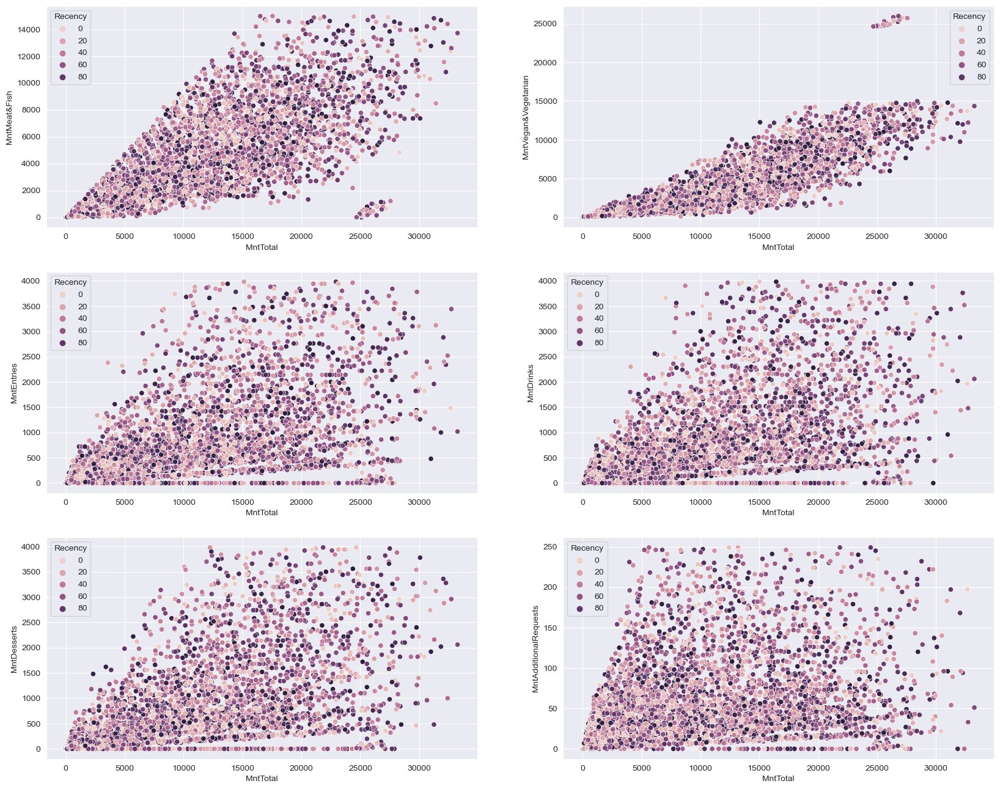

In [113]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "MntMeat&Fish", hue = "Recency")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "MntVegan&Vegetarian", hue = "Recency")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "MntEntries", hue = "Recency")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "MntDrinks", hue = "Recency")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "MntDesserts", hue = "Recency")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "MntAdditionalRequests", hue = "Recency")

<AxesSubplot:xlabel='MntTotal', ylabel='Complain'>

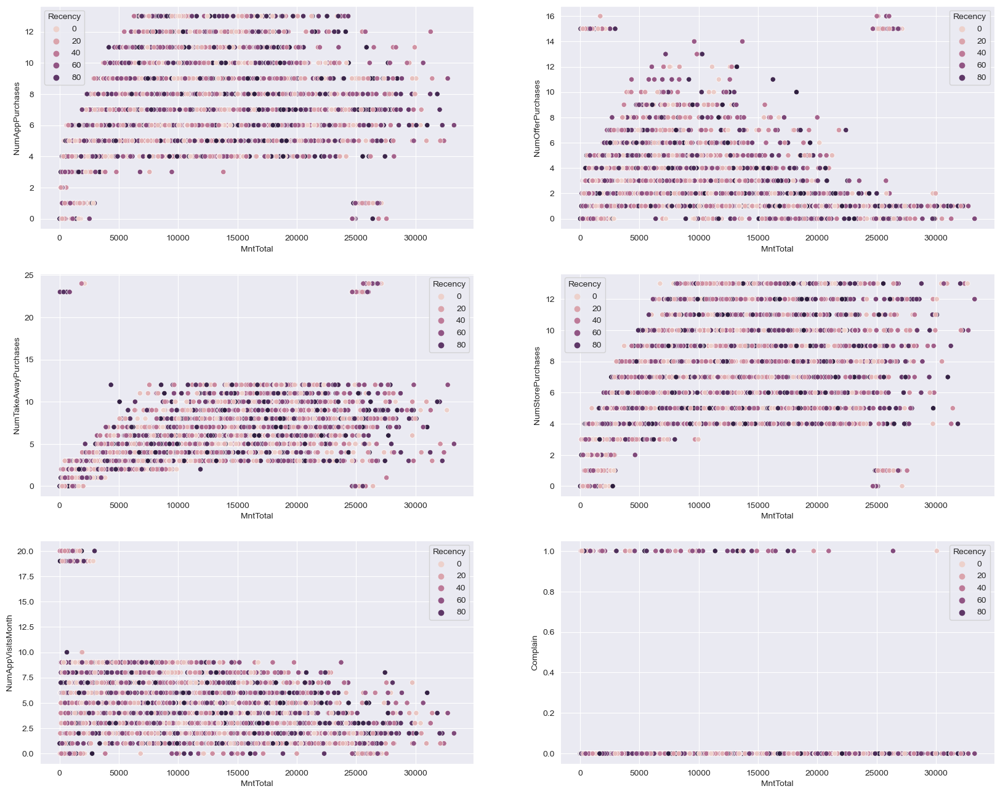

In [114]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "NumAppPurchases", hue = "Recency")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "NumOfferPurchases", hue = "Recency")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "NumTakeAwayPurchases", hue = "Recency")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "NumStorePurchases", hue = "Recency")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "NumAppVisitsMonth", hue = "Recency")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "Complain", hue = "Recency")

<AxesSubplot:xlabel='MntTotal', ylabel='MntAdditionalRequests'>

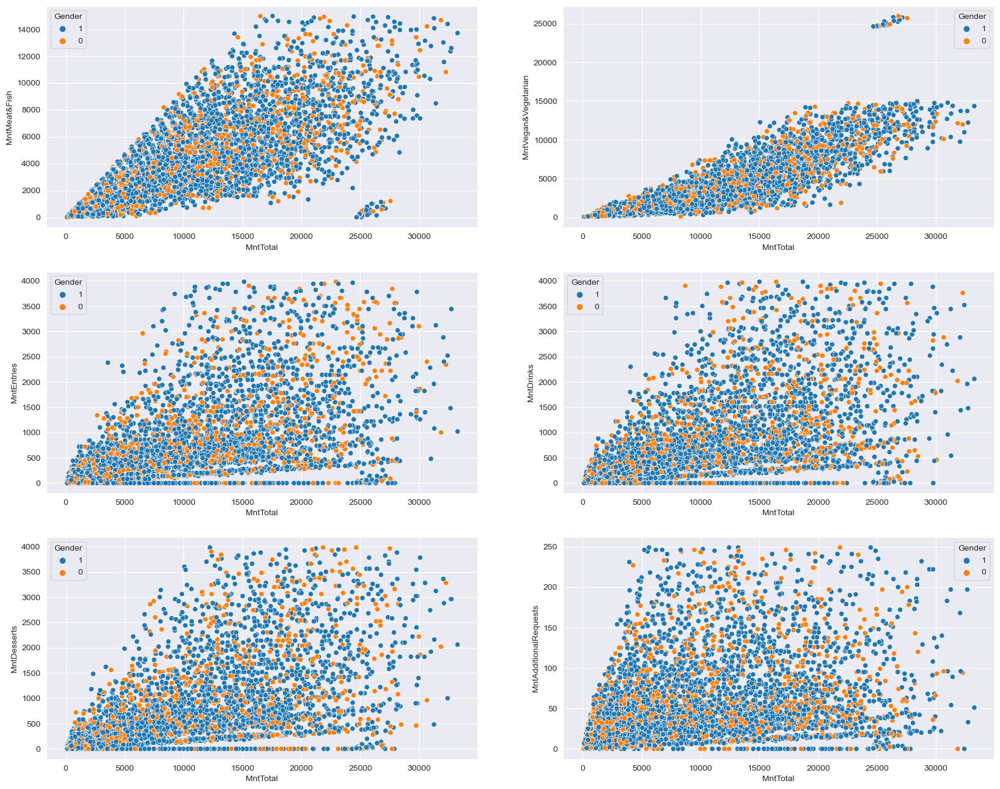

In [115]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "MntMeat&Fish", hue = "Gender")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "MntVegan&Vegetarian", hue = "Gender")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "MntEntries", hue = "Gender")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "MntDrinks", hue = "Gender")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "MntDesserts", hue = "Gender")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "MntAdditionalRequests", hue = "Gender")

<AxesSubplot:xlabel='MntTotal', ylabel='Complain'>

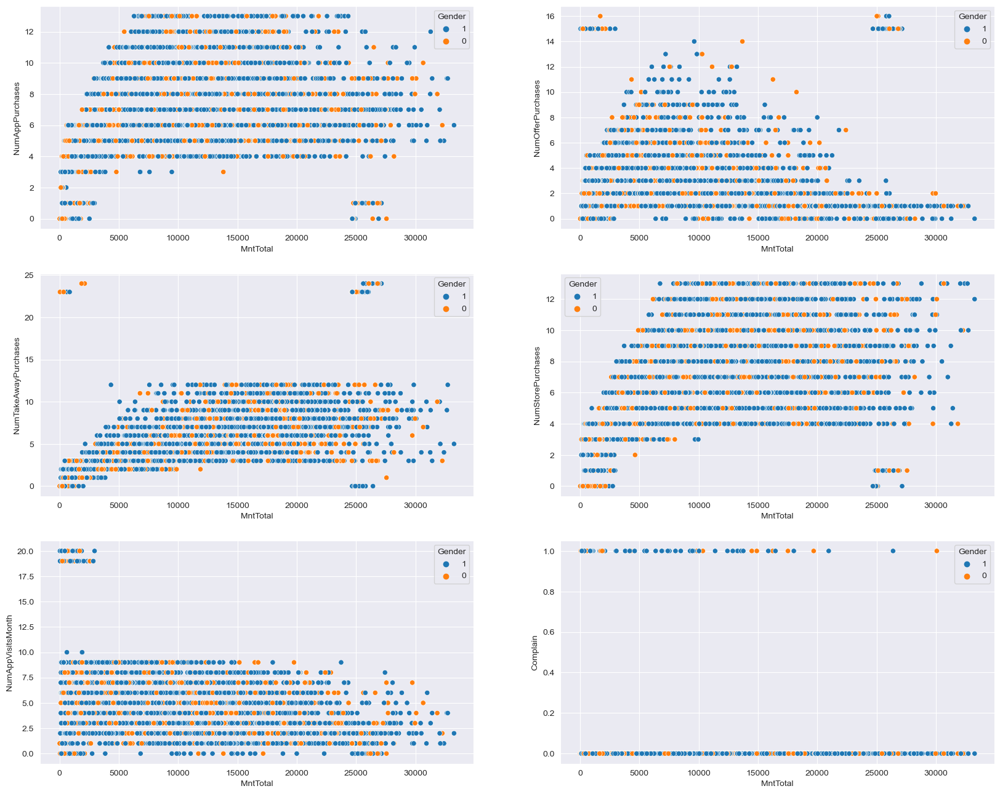

In [116]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3,2, figsize = (20,16))
sns.scatterplot(ax = ax1, data = df, x = "MntTotal", y = "NumAppPurchases", hue = "Gender")
sns.scatterplot(ax = ax2, data = df, x = "MntTotal", y = "NumOfferPurchases", hue = "Gender")
sns.scatterplot(ax = ax3, data = df, x = "MntTotal", y = "NumTakeAwayPurchases", hue = "Gender")
sns.scatterplot(ax = ax4, data = df, x = "MntTotal", y = "NumStorePurchases", hue = "Gender")
sns.scatterplot(ax = ax5, data = df, x = "MntTotal", y = "NumAppVisitsMonth", hue = "Gender")
sns.scatterplot(ax = ax6, data = df, x = "MntTotal", y = "Complain", hue = "Gender")

<AxesSubplot:>

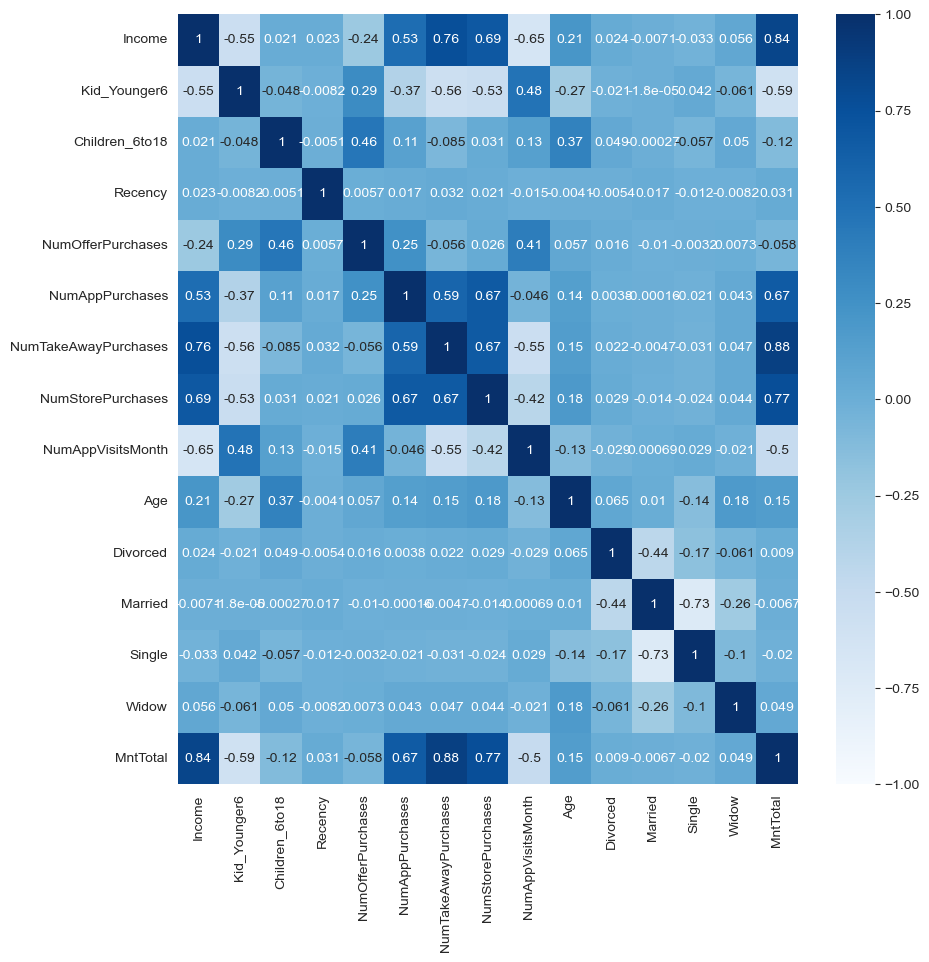

In [135]:
df2= df.copy()
df2.drop(['MntAdditionalRequests','MntDesserts','MntDrinks','MntVegan&Vegetarian','MntEntries','MntMeat&Fish','Response_Cmp1','Response_Cmp2','Response_Cmp3','Response_Cmp4','Response_Cmp5','Complain'], axis=1, inplace=True)
fig, ax = plt.subplots(figsize=(10,10))
corr = df2.corr(method='spearman')
sns.heatmap(corr,cmap="Blues",vmin=-1, vmax=1, annot=True)

1 - Mnt Total w/ positive correlations w/ Take Away Purchases , Income, NumStorePurchases, NumApp Purchases. Projecting the future marketing strategy to employ a focus on takeaway purchases on high income individual seem a good starting point
2 - Negative correlation w/ individual with children, especially younger than 6 and NumAppVisitsMonth. Two demographics to avoid

<AxesSubplot:>

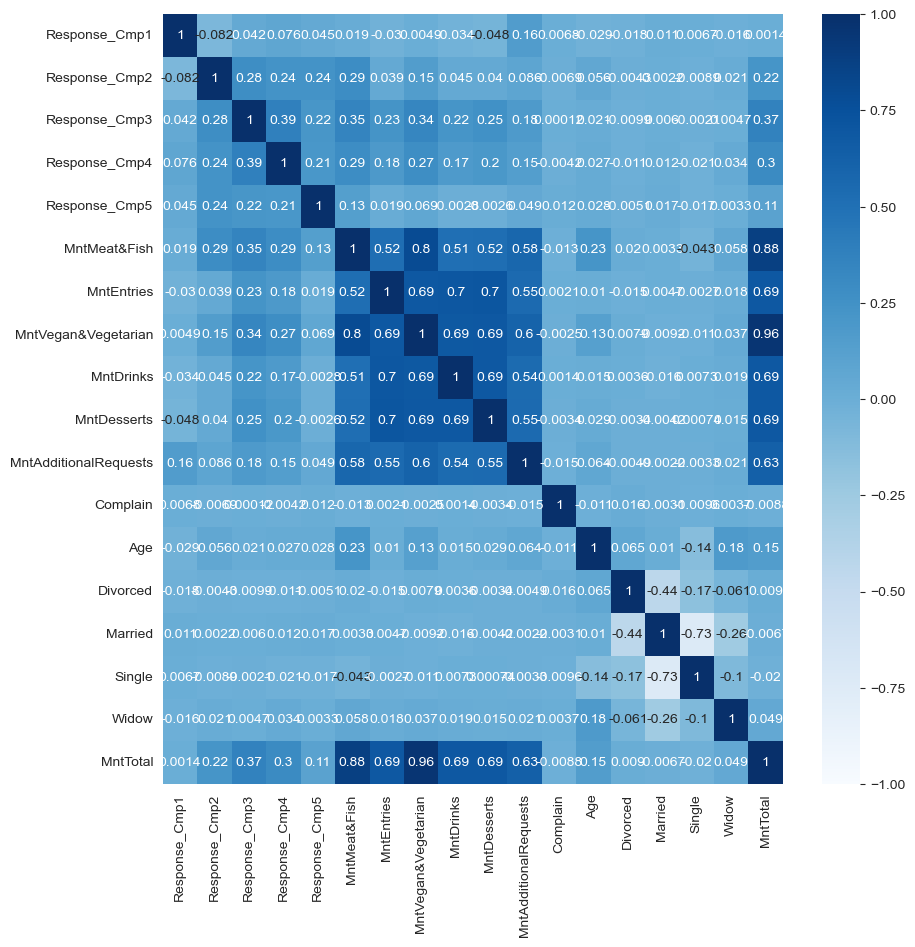

In [138]:
df3= df.copy()
df3.drop(['Income','Kid_Younger6','Children_6to18','Recency','NumOfferPurchases','NumAppPurchases','NumStorePurchases','NumTakeAwayPurchases','NumAppVisitsMonth'], axis=1, inplace=True)
fig, ax = plt.subplots(figsize=(10,10))
corr = df3.corr(method='spearman')
sns.heatmap(corr,cmap="Blues",vmin=-1, vmax=1, annot=True)

1 - Vegetarian & Meat/Fish are staples on a portfolio suggestion (especially vegetarian)
2 - Complaining as very little correlation w/ amount spent
3 - Positive correlation w/ marketing campaigns (Response cmp2/3/4/5)